In [1]:
import pathlib
from pathlib import Path
import pandas as pd

In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Thu_Jan_28_19:32:09_PST_2021
Cuda compilation tools, release 11.2, V11.2.142
Build cuda_11.2.r11.2/compiler.29558016_0
torch:  1.13 ; cuda:  1.13.0
detectron2: 0.6


In [3]:
import detectron2
from detectron2.utils.logger import setup_logger
#setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
#from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

In [4]:
setup_logger()

<Logger detectron2 (DEBUG)>

In [5]:
import matplotlib as mpl
import matplotlib.pyplot as plt 

%matplotlib inline

In [6]:
#original_folder = "valladolid_merida_8clases_25Oct2022"
#tmp_str = "coco_" + purpose

In [7]:
from detectron2.data.datasets import register_coco_instances

f = Path.cwd() / ("coco_" + "train") 
l = f / "labels.json"
d = f / "data"
register_coco_instances("my_dataset_train", {}, str(l), str(d))

In [8]:
MetadataCatalog.get("my_dataset_train")

namespace(name='my_dataset_train',
          json_file='/home/jose/darknet/coco_train/labels.json',
          image_root='/home/jose/darknet/coco_train/data',
          evaluator_type='coco')

In [9]:
f = Path.cwd() / ("coco_" + "test")
l = f / "labels.json"
d = f / "data"
register_coco_instances("my_dataset_test", {}, str(l), str(d))

In [10]:
MetadataCatalog.get("my_dataset_test")

namespace(name='my_dataset_test',
          json_file='/home/jose/darknet/coco_test/labels.json',
          image_root='/home/jose/darknet/coco_test/data',
          evaluator_type='coco')

In [11]:
f = Path.cwd() / ("coco_" + "val")
l = f / "labels.json"
d = f / "data"
register_coco_instances("my_dataset_val", {}, str(l), str(d))

In [12]:
MetadataCatalog.get("my_dataset_val")

namespace(name='my_dataset_val',
          json_file='/home/jose/darknet/coco_val/labels.json',
          image_root='/home/jose/darknet/coco_val/data',
          evaluator_type='coco')

WARNING [12/11 01:24:55 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/11 01:24:55 d2.data.datasets.coco]: Loaded 1935 images in COCO format from /home/jose/darknet/coco_train/labels.json
hi


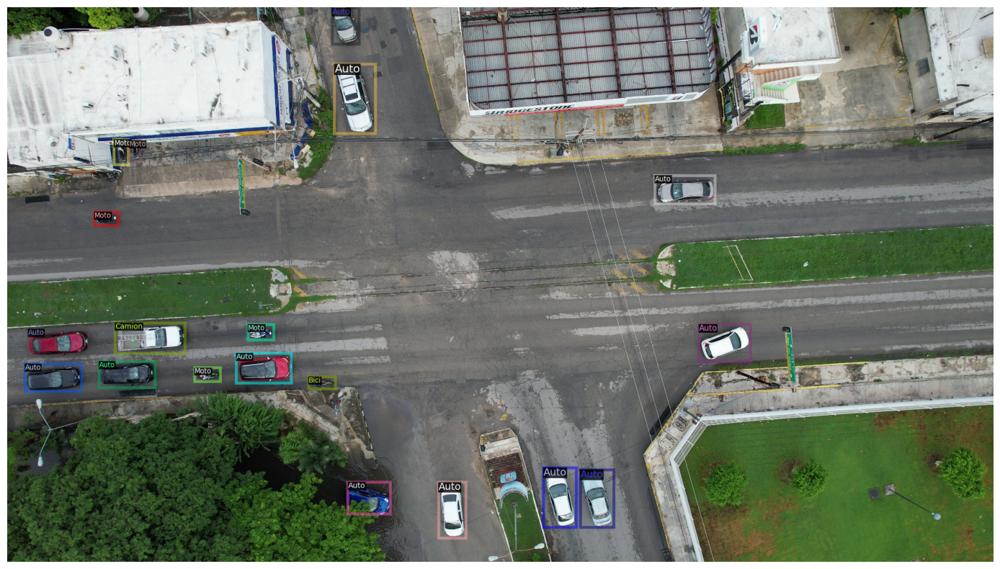

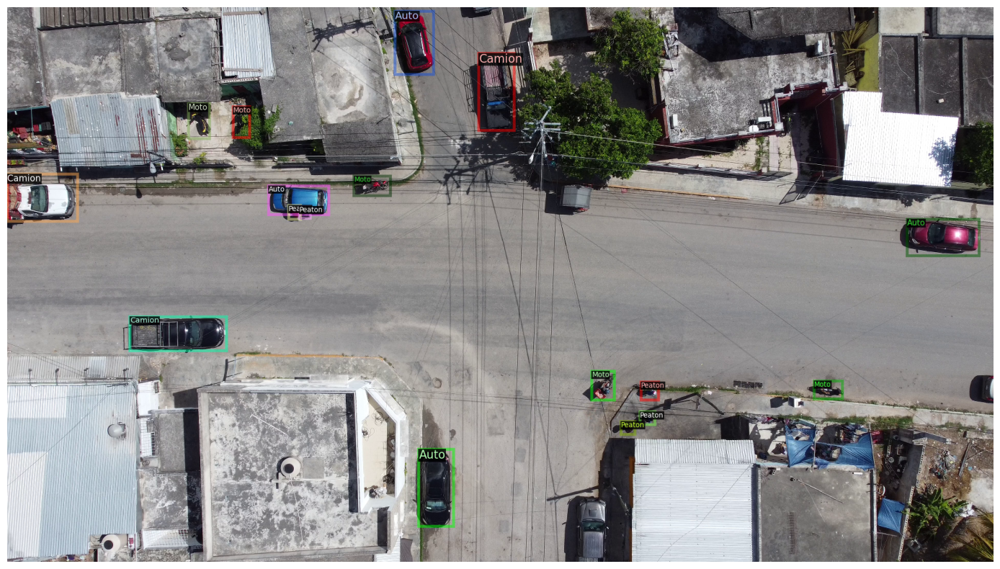

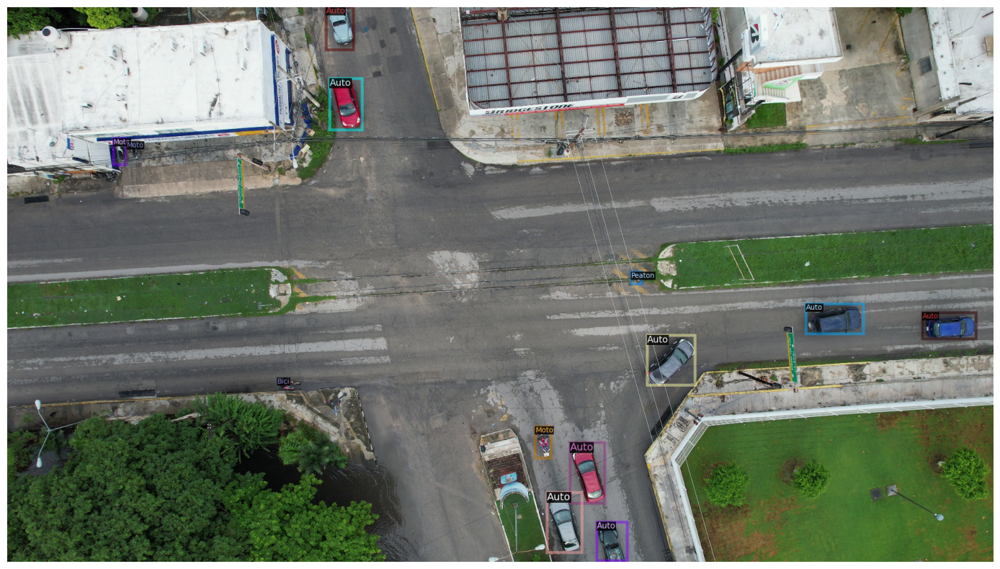

In [13]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")

dataset_dicts = DatasetCatalog.get("my_dataset_train")
print("hi")
import random
from detectron2.utils.visualizer import Visualizer


for d in random.sample(dataset_dicts, 3):
    
    img = cv2.imread(d["file_name"])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #print(d["file_name"])

    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    #cv2_imshow(vis.get_image()[:, :, ::-1])
    #cv2.imshow("img", vis.get_image()[:, :, ::-1])
    #Image(d["file_name"])
    #Image(vis.get_image()[:, :, ::-1])
    plt.figure(figsize=(20,10))
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.axis('off')
    plt.margins(x=0)
    plt.show()

In [14]:
# se busca aplicar mas tiempo, mas tamaño, y augments

In [15]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator
import detectron2.data.transforms as T
from detectron2.data import DatasetMapper, build_detection_train_loader

class CocoTrainer(DefaultTrainer):

    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):

        if output_folder is None:
            os.makedirs("coco_eval", exist_ok=True)
            output_folder = "coco_eval"

        return COCOEvaluator(dataset_name, cfg, False, output_folder)
    
    @classmethod
    def build_train_loader(cls, cfg):
        mapper = DatasetMapper(cfg, is_train=True, augmentations=[T.RandomBrightness(0.7, 1.3),
                                                                 T.RandomContrast(0.6, 1.3),
                                                                 T.RandomRotation(angle=[90, 90]),
                                                                 T.RandomLighting(0.7),
                                                                 T.RandomFlip(prob=0.5, horizontal=True, vertical=False),
                                                                 ])
        return build_detection_train_loader(cfg, mapper=mapper)
    
    #T.Resize((1000, 1000)), T.RandomCrop("relative", (0.6, 0.6))

In [16]:
from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 1

### quiza comentar si vuelve a fallar
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo

cfg.SOLVER.IMS_PER_BATCH = 1
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.CHECKPOINT_PERIOD = 250

cfg.SOLVER.WARMUP_ITERS = 800 # va subiendo lr desde 0
cfg.SOLVER.MAX_ITER = 2500 #1500 #adjust up if val mAP is still rising, adjust down if overfit

cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05


cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 8 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 200

cfg.OUTPUT_DIR = "./output_2_best_2"

# Size of the smallest side of the image during training
cfg.INPUT.MIN_SIZE_TRAIN = (912,)
# Maximum size of the side of the image during training
cfg.INPUT.MAX_SIZE_TRAIN = 1620
# Size of the smallest side of the image during testing. Set to zero to disable resize in testing.
cfg.INPUT.MIN_SIZE_TEST = 912
# Maximum size of the side of the image during testing
cfg.INPUT.MAX_SIZE_TEST = 1620


In [17]:
1+1

2

In [18]:
#resume_dir = os.getcwd()+'/output_2_best_2/'
#resume_dir

In [19]:
#os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
## hubo una interrupcion
#trainer.resume_or_load(resume=False)
trainer.resume_or_load(resume=True)


[12/11 01:26:25 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

[12/11 01:26:25 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [RandomBrightness(intensity_min=0.7, intensity_max=1.3), RandomContrast(intensity_min=0.6, intensity_max=1.3), RandomRotation(angle=[90, 90]), RandomLighting(scale=0.7), RandomFlip(prob=0.5)]
WARNING [12/11 01:26:25 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/11 01:26:25 d2.data.datasets.coco]: Loaded 1935 images in COCO format from /home/jose/darknet/coco_train/labels.json
[12/11 01:26:26 d2.data.build]: Removed 0 images with no usable annotations. 1935 images left.
[12/11 01:26:26 d2.data.build]: Distribution of instances among all 8 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|    Auto    | 10668        |  Autobus   | 278          |    Bici    | 1255         |
|   Camion   | 2192      

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (9, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (9,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (32, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (32,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, 

In [20]:
trainer.train()

[12/11 01:26:33 d2.engine.train_loop]: Starting training from iteration 0


/home/jose/miniconda3/envs/f1/lib/python3.7/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1666643004612/work/aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[12/11 01:27:20 d2.utils.events]:  eta: 1:32:20  iter: 19  total_loss: 3.386  loss_cls: 2.288  loss_box_reg: 0.6206  loss_rpn_cls: 0.4175  loss_rpn_loc: 0.09123  time: 2.2329  data_time: 0.0624  lr: 2.4726e-05  max_mem: 20728M
[12/11 01:28:06 d2.utils.events]:  eta: 1:32:26  iter: 39  total_loss: 2.901  loss_cls: 1.949  loss_box_reg: 0.6859  loss_rpn_cls: 0.2005  loss_rpn_loc: 0.1007  time: 2.2539  data_time: 0.0061  lr: 4.9701e-05  max_mem: 20728M
[12/11 01:28:53 d2.utils.events]:  eta: 1:32:22  iter: 59  total_loss: 2.296  loss_cls: 1.359  loss_box_reg: 0.7083  loss_rpn_cls: 0.05925  loss_rpn_loc: 0.0807  time: 2.2873  data_time: 0.0060  lr: 7.4676e-05  max_mem: 20728M
[12/11 01:29:44 d2.utils.events]:  eta: 1:32:44  iter: 79  total_loss: 1.799  loss_cls: 0.9702  loss_box_reg: 0.707  loss_rpn_cls: 0.02011  loss_rpn_loc: 0.06659  time: 2.3625  data_time: 0.0061  lr: 9.9651e-05  max_mem: 20728M
[12/11 01:30:38 d2.utils.events]:  eta: 1:33:26  iter: 99  total_loss: 1.815  loss_cls: 0.87

[12/11 01:37:24 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.16 seconds.
[12/11 01:37:24 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/11 01:37:24 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.04 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.026
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.055
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.022
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.014
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.030
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.011
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.060
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.086
 Aver

[12/11 01:48:23 d2.evaluation.evaluator]: Inference done 175/242. Dataloading: 0.3539 s/iter. Inference: 0.1613 s/iter. Eval: 0.0003 s/iter. Total: 0.5157 s/iter. ETA=0:00:34
[12/11 01:48:28 d2.evaluation.evaluator]: Inference done 186/242. Dataloading: 0.3512 s/iter. Inference: 0.1612 s/iter. Eval: 0.0003 s/iter. Total: 0.5127 s/iter. ETA=0:00:28
[12/11 01:48:33 d2.evaluation.evaluator]: Inference done 197/242. Dataloading: 0.3498 s/iter. Inference: 0.1611 s/iter. Eval: 0.0003 s/iter. Total: 0.5113 s/iter. ETA=0:00:23
[12/11 01:48:39 d2.evaluation.evaluator]: Inference done 208/242. Dataloading: 0.3486 s/iter. Inference: 0.1609 s/iter. Eval: 0.0003 s/iter. Total: 0.5100 s/iter. ETA=0:00:17
[12/11 01:48:44 d2.evaluation.evaluator]: Inference done 219/242. Dataloading: 0.3480 s/iter. Inference: 0.1608 s/iter. Eval: 0.0003 s/iter. Total: 0.5093 s/iter. ETA=0:00:11
[12/11 01:48:50 d2.evaluation.evaluator]: Inference done 230/242. Dataloading: 0.3473 s/iter. Inference: 0.1608 s/iter. Eval:

[12/11 01:58:55 d2.evaluation.evaluator]: Inference done 62/242. Dataloading: 0.3478 s/iter. Inference: 0.1618 s/iter. Eval: 0.0002 s/iter. Total: 0.5099 s/iter. ETA=0:01:31
[12/11 01:59:01 d2.evaluation.evaluator]: Inference done 73/242. Dataloading: 0.3432 s/iter. Inference: 0.1615 s/iter. Eval: 0.0002 s/iter. Total: 0.5051 s/iter. ETA=0:01:25
[12/11 01:59:06 d2.evaluation.evaluator]: Inference done 83/242. Dataloading: 0.3441 s/iter. Inference: 0.1614 s/iter. Eval: 0.0002 s/iter. Total: 0.5058 s/iter. ETA=0:01:20
[12/11 01:59:11 d2.evaluation.evaluator]: Inference done 93/242. Dataloading: 0.3456 s/iter. Inference: 0.1611 s/iter. Eval: 0.0002 s/iter. Total: 0.5071 s/iter. ETA=0:01:15
[12/11 01:59:16 d2.evaluation.evaluator]: Inference done 103/242. Dataloading: 0.3469 s/iter. Inference: 0.1609 s/iter. Eval: 0.0002 s/iter. Total: 0.5083 s/iter. ETA=0:01:10
[12/11 01:59:21 d2.evaluation.evaluator]: Inference done 113/242. Dataloading: 0.3480 s/iter. Inference: 0.1608 s/iter. Eval: 0.0

WARNING [12/11 02:09:53 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/11 02:09:53 d2.data.datasets.coco]: Loaded 242 images in COCO format from /home/jose/darknet/coco_val/labels.json
[12/11 02:09:53 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(912, 912), max_size=1620, sample_style='choice')]
[12/11 02:09:53 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[12/11 02:09:53 d2.data.common]: Serializing 242 elements to byte tensors and concatenating them all ...
[12/11 02:09:53 d2.data.common]: Serialized dataset takes 0.26 MiB
WARNING [12/11 02:09:53 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[12/11 02:09:53 d2.evaluation.evaluator]: Start inference on 242 batches
[12/11 02:09:59 d2.evaluation.eva

[12/11 02:13:46 d2.utils.events]:  eta: 1:18:11  iter: 839  total_loss: 1.015  loss_cls: 0.3173  loss_box_reg: 0.5656  loss_rpn_cls: 0.004061  loss_rpn_loc: 0.04584  time: 2.7724  data_time: 0.0039  lr: 0.001  max_mem: 20728M
[12/11 02:14:43 d2.utils.events]:  eta: 1:17:14  iter: 859  total_loss: 0.8916  loss_cls: 0.2791  loss_box_reg: 0.531  loss_rpn_cls: 0.004146  loss_rpn_loc: 0.05393  time: 2.7736  data_time: 0.0055  lr: 0.001  max_mem: 20728M
[12/11 02:15:39 d2.utils.events]:  eta: 1:16:17  iter: 879  total_loss: 0.9924  loss_cls: 0.3571  loss_box_reg: 0.5451  loss_rpn_cls: 0.002341  loss_rpn_loc: 0.06224  time: 2.7748  data_time: 0.0055  lr: 0.001  max_mem: 20728M
[12/11 02:16:36 d2.utils.events]:  eta: 1:15:20  iter: 899  total_loss: 1.011  loss_cls: 0.3566  loss_box_reg: 0.6165  loss_rpn_cls: 0.002857  loss_rpn_loc: 0.0538  time: 2.7760  data_time: 0.0055  lr: 0.001  max_mem: 20728M
[12/11 02:17:33 d2.utils.events]:  eta: 1:14:25  iter: 919  total_loss: 1.047  loss_cls: 0.38  l

[12/11 02:23:24 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category   | AP     | category   | AP     | category   | AP    |
|:-----------|:-------|:-----------|:-------|:-----------|:------|
| Auto       | 23.207 | Autobus    | 10.483 | Bici       | 0.038 |
| Camion     | 5.696  | Combi      | 0.063  | Moto       | 0.579 |
| MotoTaxi   | 0.000  | Peaton     | 0.071  |            |       |
[12/11 02:23:24 d2.engine.defaults]: Evaluation results for my_dataset_val in csv format:
[12/11 02:23:24 d2.evaluation.testing]: copypaste: Task: bbox
[12/11 02:23:24 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/11 02:23:24 d2.evaluation.testing]: copypaste: 5.0170,10.7616,3.4188,0.0000,1.3293,5.7330
[12/11 02:23:24 d2.utils.events]:  eta: 1:10:42  iter: 999  total_loss: 0.8057  loss_cls: 0.3075  loss_box_reg: 0.5141  loss_rpn_cls: 0.005475  loss_rpn_loc: 0.043  time: 2.7823  data_time: 0.0040  lr: 0.001  max_mem: 20728M
[12/11 02:24:18 d2.utils.events]:  eta: 1:09:45

[12/11 02:34:53 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/11 02:34:53 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[12/11 02:34:53 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[12/11 02:34:53 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[12/11 02:34:53 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.08 seconds.
[12/11 02:34:53 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/11 02:34:53 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.03 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.058
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.109
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.050
 Average Precision  (AP) @[ IoU=0.50:

[12/11 02:45:37 d2.evaluation.evaluator]: Inference done 154/242. Dataloading: 0.3478 s/iter. Inference: 0.1606 s/iter. Eval: 0.0002 s/iter. Total: 0.5087 s/iter. ETA=0:00:44
[12/11 02:45:42 d2.evaluation.evaluator]: Inference done 164/242. Dataloading: 0.3483 s/iter. Inference: 0.1605 s/iter. Eval: 0.0002 s/iter. Total: 0.5092 s/iter. ETA=0:00:39
[12/11 02:45:48 d2.evaluation.evaluator]: Inference done 174/242. Dataloading: 0.3489 s/iter. Inference: 0.1605 s/iter. Eval: 0.0002 s/iter. Total: 0.5098 s/iter. ETA=0:00:34
[12/11 02:45:53 d2.evaluation.evaluator]: Inference done 185/242. Dataloading: 0.3474 s/iter. Inference: 0.1604 s/iter. Eval: 0.0002 s/iter. Total: 0.5082 s/iter. ETA=0:00:28
[12/11 02:45:58 d2.evaluation.evaluator]: Inference done 195/242. Dataloading: 0.3470 s/iter. Inference: 0.1604 s/iter. Eval: 0.0002 s/iter. Total: 0.5078 s/iter. ETA=0:00:23
[12/11 02:46:03 d2.evaluation.evaluator]: Inference done 205/242. Dataloading: 0.3475 s/iter. Inference: 0.1604 s/iter. Eval:

[12/11 02:56:08 d2.evaluation.evaluator]: Inference done 41/242. Dataloading: 0.3523 s/iter. Inference: 0.1625 s/iter. Eval: 0.0002 s/iter. Total: 0.5152 s/iter. ETA=0:01:43
[12/11 02:56:13 d2.evaluation.evaluator]: Inference done 51/242. Dataloading: 0.3516 s/iter. Inference: 0.1620 s/iter. Eval: 0.0003 s/iter. Total: 0.5140 s/iter. ETA=0:01:38
[12/11 02:56:18 d2.evaluation.evaluator]: Inference done 61/242. Dataloading: 0.3564 s/iter. Inference: 0.1616 s/iter. Eval: 0.0003 s/iter. Total: 0.5184 s/iter. ETA=0:01:33
[12/11 02:56:24 d2.evaluation.evaluator]: Inference done 72/242. Dataloading: 0.3526 s/iter. Inference: 0.1613 s/iter. Eval: 0.0003 s/iter. Total: 0.5143 s/iter. ETA=0:01:27
[12/11 02:56:29 d2.evaluation.evaluator]: Inference done 82/242. Dataloading: 0.3533 s/iter. Inference: 0.1610 s/iter. Eval: 0.0002 s/iter. Total: 0.5147 s/iter. ETA=0:01:22
[12/11 02:56:34 d2.evaluation.evaluator]: Inference done 92/242. Dataloading: 0.3558 s/iter. Inference: 0.1608 s/iter. Eval: 0.000

[12/11 03:05:23 d2.utils.events]:  eta: 0:34:50  iter: 1759  total_loss: 0.9745  loss_cls: 0.3198  loss_box_reg: 0.5464  loss_rpn_cls: 0.007775  loss_rpn_loc: 0.06377  time: 2.7965  data_time: 0.0082  lr: 2.5e-06  max_mem: 20728M
[12/11 03:06:20 d2.utils.events]:  eta: 0:33:54  iter: 1779  total_loss: 0.9956  loss_cls: 0.3572  loss_box_reg: 0.6025  loss_rpn_cls: 0.00481  loss_rpn_loc: 0.05843  time: 2.7970  data_time: 0.0075  lr: 2.5e-06  max_mem: 20728M
WARNING [12/11 03:07:17 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/11 03:07:17 d2.data.datasets.coco]: Loaded 242 images in COCO format from /home/jose/darknet/coco_val/labels.json
[12/11 03:07:17 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(912, 912), max_size=1620, sample_style='choice')]
[12/11 03:07:17 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerial

[12/11 03:09:20 d2.evaluation.testing]: copypaste: 5.5233,10.7692,4.5001,0.0000,0.6179,6.3205
[12/11 03:09:20 d2.utils.events]:  eta: 0:32:57  iter: 1799  total_loss: 0.9657  loss_cls: 0.3225  loss_box_reg: 0.5915  loss_rpn_cls: 0.008094  loss_rpn_loc: 0.04428  time: 2.7974  data_time: 0.0076  lr: 2.5e-06  max_mem: 20728M
[12/11 03:10:14 d2.utils.events]:  eta: 0:32:00  iter: 1819  total_loss: 1.022  loss_cls: 0.3549  loss_box_reg: 0.5712  loss_rpn_cls: 0.002289  loss_rpn_loc: 0.05783  time: 2.7963  data_time: 0.0059  lr: 2.5e-06  max_mem: 20728M
[12/11 03:11:10 d2.utils.events]:  eta: 0:31:03  iter: 1839  total_loss: 0.8544  loss_cls: 0.2991  loss_box_reg: 0.4547  loss_rpn_cls: 0.003776  loss_rpn_loc: 0.045  time: 2.7965  data_time: 0.0071  lr: 2.5e-06  max_mem: 20728M
[12/11 03:12:07 d2.utils.events]:  eta: 0:30:07  iter: 1859  total_loss: 0.9272  loss_cls: 0.3129  loss_box_reg: 0.5071  loss_rpn_cls: 0.003569  loss_rpn_loc: 0.05192  time: 2.7970  data_time: 0.0069  lr: 2.5e-06  max_m

[12/11 03:20:47 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.03 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.055
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.108
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.046
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.006
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.063
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.049
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.113
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.117
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.011
 Average Recall     (A

[12/11 03:31:45 d2.evaluation.evaluator]: Inference done 186/242. Dataloading: 0.3435 s/iter. Inference: 0.1600 s/iter. Eval: 0.0002 s/iter. Total: 0.5038 s/iter. ETA=0:00:28
[12/11 03:31:50 d2.evaluation.evaluator]: Inference done 197/242. Dataloading: 0.3428 s/iter. Inference: 0.1599 s/iter. Eval: 0.0002 s/iter. Total: 0.5030 s/iter. ETA=0:00:22
[12/11 03:31:55 d2.evaluation.evaluator]: Inference done 208/242. Dataloading: 0.3420 s/iter. Inference: 0.1598 s/iter. Eval: 0.0002 s/iter. Total: 0.5021 s/iter. ETA=0:00:17
[12/11 03:32:01 d2.evaluation.evaluator]: Inference done 219/242. Dataloading: 0.3414 s/iter. Inference: 0.1598 s/iter. Eval: 0.0002 s/iter. Total: 0.5015 s/iter. ETA=0:00:11
[12/11 03:32:06 d2.evaluation.evaluator]: Inference done 230/242. Dataloading: 0.3412 s/iter. Inference: 0.1597 s/iter. Eval: 0.0002 s/iter. Total: 0.5013 s/iter. ETA=0:00:06
[12/11 03:32:12 d2.evaluation.evaluator]: Inference done 241/242. Dataloading: 0.3409 s/iter. Inference: 0.1597 s/iter. Eval:

[12/11 03:42:13 d2.evaluation.evaluator]: Inference done 73/242. Dataloading: 0.3439 s/iter. Inference: 0.1612 s/iter. Eval: 0.0003 s/iter. Total: 0.5055 s/iter. ETA=0:01:25
[12/11 03:42:18 d2.evaluation.evaluator]: Inference done 83/242. Dataloading: 0.3446 s/iter. Inference: 0.1610 s/iter. Eval: 0.0002 s/iter. Total: 0.5060 s/iter. ETA=0:01:20
[12/11 03:42:23 d2.evaluation.evaluator]: Inference done 93/242. Dataloading: 0.3466 s/iter. Inference: 0.1609 s/iter. Eval: 0.0002 s/iter. Total: 0.5078 s/iter. ETA=0:01:15
[12/11 03:42:28 d2.evaluation.evaluator]: Inference done 103/242. Dataloading: 0.3489 s/iter. Inference: 0.1607 s/iter. Eval: 0.0002 s/iter. Total: 0.5100 s/iter. ETA=0:01:10
[12/11 03:42:34 d2.evaluation.evaluator]: Inference done 113/242. Dataloading: 0.3497 s/iter. Inference: 0.1607 s/iter. Eval: 0.0002 s/iter. Total: 0.5107 s/iter. ETA=0:01:05
[12/11 03:42:39 d2.evaluation.evaluator]: Inference done 124/242. Dataloading: 0.3484 s/iter. Inference: 0.1606 s/iter. Eval: 0.

[12/11 03:48:18 d2.evaluation.evaluator]: Start inference on 242 batches
[12/11 03:48:24 d2.evaluation.evaluator]: Inference done 11/242. Dataloading: 0.3400 s/iter. Inference: 0.1621 s/iter. Eval: 0.0003 s/iter. Total: 0.5024 s/iter. ETA=0:01:56
[12/11 03:48:30 d2.evaluation.evaluator]: Inference done 20/242. Dataloading: 0.3777 s/iter. Inference: 0.1613 s/iter. Eval: 0.0003 s/iter. Total: 0.5394 s/iter. ETA=0:01:59
[12/11 03:48:35 d2.evaluation.evaluator]: Inference done 30/242. Dataloading: 0.3780 s/iter. Inference: 0.1612 s/iter. Eval: 0.0003 s/iter. Total: 0.5396 s/iter. ETA=0:01:54
[12/11 03:48:40 d2.evaluation.evaluator]: Inference done 40/242. Dataloading: 0.3702 s/iter. Inference: 0.1612 s/iter. Eval: 0.0003 s/iter. Total: 0.5319 s/iter. ETA=0:01:47
[12/11 03:48:45 d2.evaluation.evaluator]: Inference done 50/242. Dataloading: 0.3681 s/iter. Inference: 0.1609 s/iter. Eval: 0.0003 s/iter. Total: 0.5294 s/iter. ETA=0:01:41
[12/11 03:48:50 d2.evaluation.evaluator]: Inference done 

In [ ]:
# 01:26:33 - 03:50:24 - 2:20hrs aprox

In [ ]:
# before interruption
trainer.train()

[12/10 22:28:10 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

[12/10 22:28:10 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [RandomBrightness(intensity_min=0.7, intensity_max=1.3), RandomContrast(intensity_min=0.6, intensity_max=1.3), RandomRotation(angle=[90, 90]), RandomLighting(scale=0.7), RandomFlip(prob=0.5)]
WARNING [12/10 22:28:10 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/10 22:28:10 d2.data.datasets.coco]: Loaded 1935 images in COCO format from /home/jose/darknet/coco_train/labels.json
[12/10 22:28:10 d2.data.build]: Removed 0 images with no usable annotations. 1935 images left.
[12/10 22:28:10 d2.data.build]: Distribution of instances among all 8 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|    Auto    | 10668        |  Autobus   | 278          |    Bici    | 1255         |
|   Camion   | 2192      

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (9, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (9,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (32, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (32,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, 

[12/10 22:28:10 d2.engine.train_loop]: Starting training from iteration 0


/home/jose/miniconda3/envs/f1/lib/python3.7/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1666643004612/work/aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[12/10 22:28:57 d2.utils.events]:  eta: 1:31:25  iter: 19  total_loss: 3.505  loss_cls: 2.27  loss_box_reg: 0.6302  loss_rpn_cls: 0.3735  loss_rpn_loc: 0.1305  time: 2.2090  data_time: 0.0593  lr: 2.4726e-05  max_mem: 20728M
[12/10 22:29:42 d2.utils.events]:  eta: 1:31:22  iter: 39  total_loss: 2.911  loss_cls: 1.923  loss_box_reg: 0.6938  loss_rpn_cls: 0.1516  loss_rpn_loc: 0.1264  time: 2.2298  data_time: 0.0075  lr: 4.9701e-05  max_mem: 20728M
[12/10 22:30:28 d2.utils.events]:  eta: 1:31:28  iter: 59  total_loss: 2.256  loss_cls: 1.374  loss_box_reg: 0.7916  loss_rpn_cls: 0.05738  loss_rpn_loc: 0.07698  time: 2.2479  data_time: 0.0057  lr: 7.4676e-05  max_mem: 20728M
[12/10 22:31:16 d2.utils.events]:  eta: 1:31:24  iter: 79  total_loss: 1.852  loss_cls: 0.9427  loss_box_reg: 0.7291  loss_rpn_cls: 0.03598  loss_rpn_loc: 0.07411  time: 2.2869  data_time: 0.0079  lr: 9.9651e-05  max_mem: 20728M
[12/10 22:32:08 d2.utils.events]:  eta: 1:31:27  iter: 99  total_loss: 1.675  loss_cls: 0.79

[12/10 22:38:39 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.15 seconds.
[12/10 22:38:39 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/10 22:38:39 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.04 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.035
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.084
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.019
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.017
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.040
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.023
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.090
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.115
 Aver

[12/10 22:49:14 d2.evaluation.evaluator]: Inference done 175/242. Dataloading: 0.3460 s/iter. Inference: 0.1594 s/iter. Eval: 0.0003 s/iter. Total: 0.5058 s/iter. ETA=0:00:33
[12/10 22:49:19 d2.evaluation.evaluator]: Inference done 186/242. Dataloading: 0.3440 s/iter. Inference: 0.1594 s/iter. Eval: 0.0003 s/iter. Total: 0.5038 s/iter. ETA=0:00:28
[12/10 22:49:24 d2.evaluation.evaluator]: Inference done 197/242. Dataloading: 0.3432 s/iter. Inference: 0.1593 s/iter. Eval: 0.0003 s/iter. Total: 0.5029 s/iter. ETA=0:00:22
[12/10 22:49:30 d2.evaluation.evaluator]: Inference done 208/242. Dataloading: 0.3424 s/iter. Inference: 0.1593 s/iter. Eval: 0.0003 s/iter. Total: 0.5020 s/iter. ETA=0:00:17
[12/10 22:49:35 d2.evaluation.evaluator]: Inference done 219/242. Dataloading: 0.3417 s/iter. Inference: 0.1592 s/iter. Eval: 0.0003 s/iter. Total: 0.5013 s/iter. ETA=0:00:11
[12/10 22:49:41 d2.evaluation.evaluator]: Inference done 230/242. Dataloading: 0.3415 s/iter. Inference: 0.1592 s/iter. Eval:

[12/10 22:59:46 d2.evaluation.evaluator]: Inference done 62/242. Dataloading: 0.3448 s/iter. Inference: 0.1627 s/iter. Eval: 0.0003 s/iter. Total: 0.5080 s/iter. ETA=0:01:31
[12/10 22:59:52 d2.evaluation.evaluator]: Inference done 73/242. Dataloading: 0.3399 s/iter. Inference: 0.1623 s/iter. Eval: 0.0003 s/iter. Total: 0.5026 s/iter. ETA=0:01:24
[12/10 22:59:57 d2.evaluation.evaluator]: Inference done 83/242. Dataloading: 0.3416 s/iter. Inference: 0.1619 s/iter. Eval: 0.0003 s/iter. Total: 0.5040 s/iter. ETA=0:01:20
[12/10 23:00:02 d2.evaluation.evaluator]: Inference done 93/242. Dataloading: 0.3436 s/iter. Inference: 0.1616 s/iter. Eval: 0.0003 s/iter. Total: 0.5056 s/iter. ETA=0:01:15
[12/10 23:00:07 d2.evaluation.evaluator]: Inference done 103/242. Dataloading: 0.3456 s/iter. Inference: 0.1614 s/iter. Eval: 0.0003 s/iter. Total: 0.5074 s/iter. ETA=0:01:10
[12/10 23:00:12 d2.evaluation.evaluator]: Inference done 113/242. Dataloading: 0.3467 s/iter. Inference: 0.1612 s/iter. Eval: 0.0

WARNING [12/10 23:10:44 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/10 23:10:44 d2.data.datasets.coco]: Loaded 242 images in COCO format from /home/jose/darknet/coco_val/labels.json
[12/10 23:10:44 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(912, 912), max_size=1620, sample_style='choice')]
[12/10 23:10:44 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[12/10 23:10:44 d2.data.common]: Serializing 242 elements to byte tensors and concatenating them all ...
[12/10 23:10:44 d2.data.common]: Serialized dataset takes 0.26 MiB
WARNING [12/10 23:10:44 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[12/10 23:10:44 d2.evaluation.evaluator]: Start inference on 242 batches
[12/10 23:10:50 d2.evaluation.eva

[12/10 23:14:36 d2.utils.events]:  eta: 1:16:36  iter: 839  total_loss: 1.189  loss_cls: 0.4372  loss_box_reg: 0.6237  loss_rpn_cls: 0.003684  loss_rpn_loc: 0.05608  time: 2.7288  data_time: 0.0040  lr: 0.001  max_mem: 20728M


In [ ]:
# 21:15:54 - 22:23:58 1:10 hr aprox

In [25]:
!kill 90616

In [24]:
%reload_ext tensorboard
%tensorboard --logdir output_2_best_2

Reusing TensorBoard on port 6006 (pid 90616), started 0:39:30 ago. (Use '!kill 90616' to kill it.)

In [23]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output_2_best_2

In [21]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output_2_best_2/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

[12/11 09:11:20 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (256,) (256,) (256,) (256,) (256,64,1,1)        |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (256,) (256,) (256,) (256,) (256,8,3,3)         |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

WARNING [12/11 09:11:20 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [12/11 09:11:20 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/11 09:11:20 d2.data.datasets.coco]: Loaded 242 images in COCO format from /home/jose/darknet/coco_test/labels.json
[12/11 09:11:20 d2.data.build]: Distribution of instances among all 8 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|    Auto    | 1459         |  Autobus   | 45           |    Bici    | 166          |
|   Camion   | 295          |   Combi    | 45           |    Moto    | 645          |
|  MotoTaxi  | 51           |   Peaton   | 1145         |            |              |
|   total    | 3851         |            |              |    

OrderedDict([('bbox',
              {'AP': 6.589501970021383,
               'AP50': 12.493084344933294,
               'AP75': 6.099157876991183,
               'APs': 0.0,
               'APm': 0.6571339194482488,
               'APl': 7.589530046624201,
               'AP-Auto': 23.540363351979618,
               'AP-Autobus': 20.21078712266831,
               'AP-Bici': 0.03084236995128084,
               'AP-Camion': 8.53363816694286,
               'AP-Combi': 0.05940594059405942,
               'AP-Moto': 0.27349953491551304,
               'AP-MotoTaxi': 0.0,
               'AP-Peaton': 0.06747927311941168})])

In [22]:
#visualize test data
my_dataset_test_metadata = MetadataCatalog.get("my_dataset_test")
test_dataset_dicts = DatasetCatalog.get("my_dataset_test")

import random
from detectron2.utils.visualizer import Visualizer


WARNING [12/11 09:15:43 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/11 09:15:43 d2.data.datasets.coco]: Loaded 242 images in COCO format from /home/jose/darknet/coco_test/labels.json


In [23]:
my_dataset_test_metadata

namespace(name='my_dataset_test',
          json_file='/home/jose/darknet/coco_test/labels.json',
          image_root='/home/jose/darknet/coco_test/data',
          evaluator_type='coco',
          thing_classes=['Auto',
                         'Autobus',
                         'Bici',
                         'Camion',
                         'Combi',
                         'Moto',
                         'MotoTaxi',
                         'Peaton'],
          thing_dataset_id_to_contiguous_id={0: 0,
                                             1: 1,
                                             2: 2,
                                             3: 3,
                                             4: 4,
                                             5: 5,
                                             6: 6,
                                             7: 7})

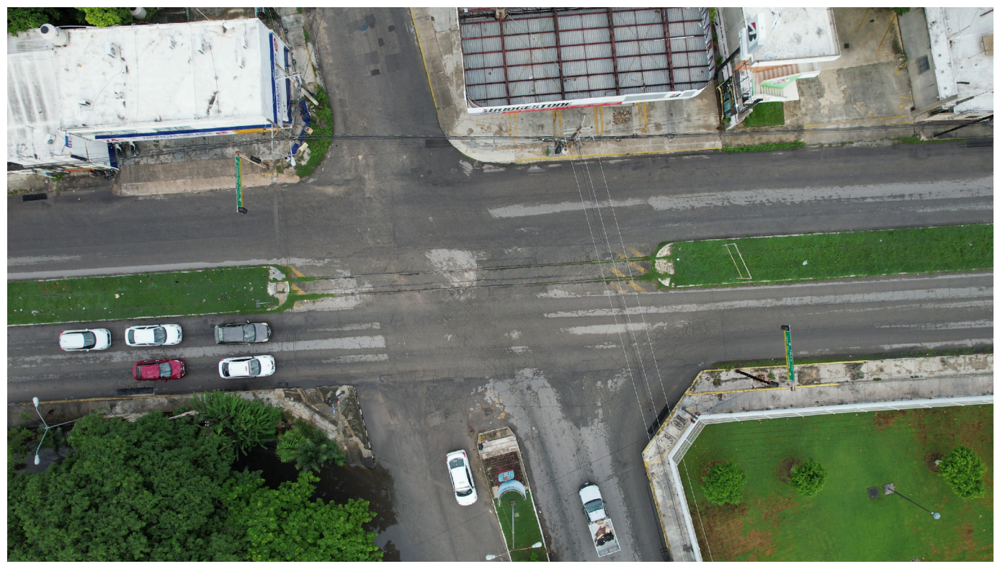

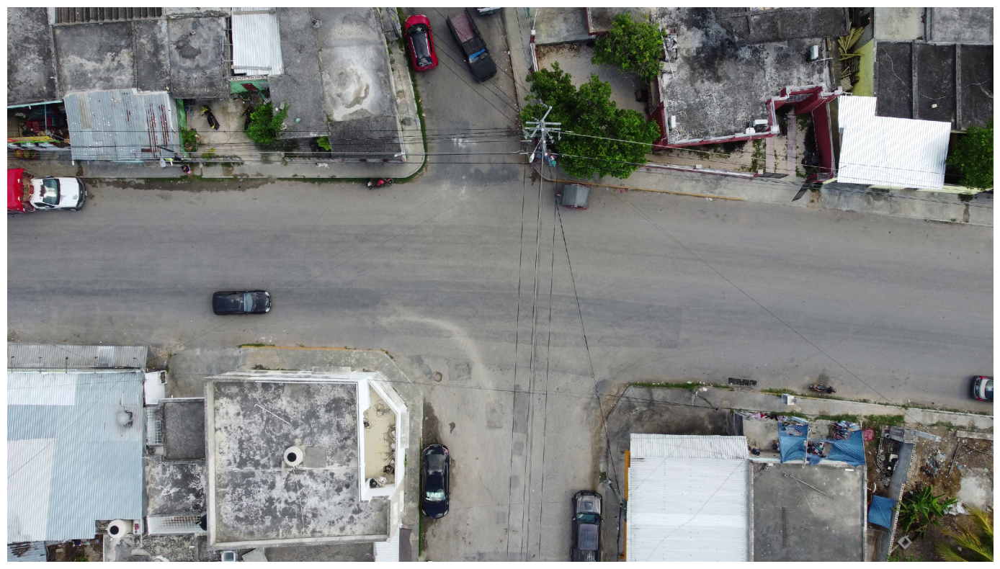

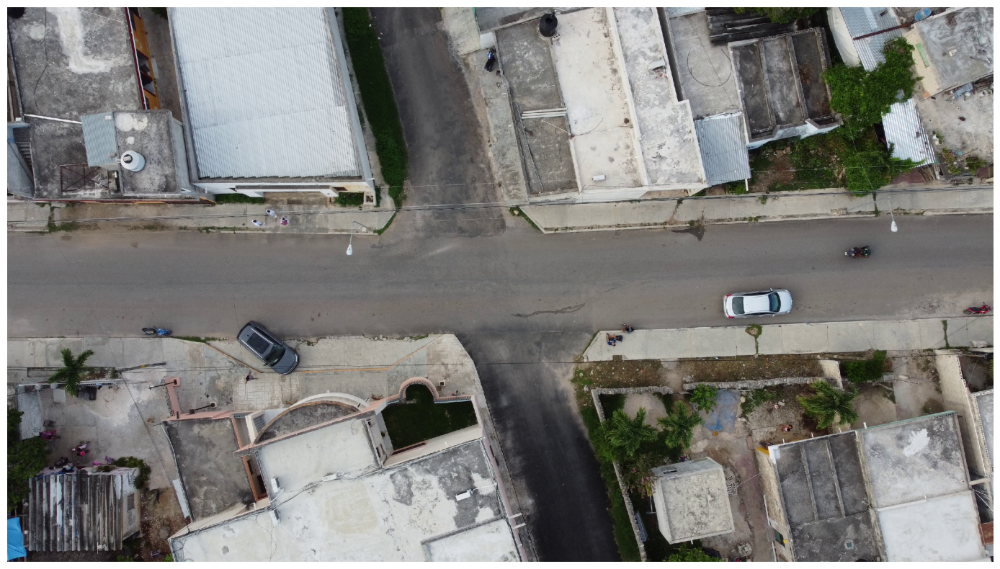

In [25]:
for d in random.sample(test_dataset_dicts, 3):
#for imageName in random.choices(test_imgs, k=3):
    print()
    #im = cv2.imread(imageName)
    im = cv2.imread(d["file_name"])
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                metadata=my_dataset_test_metadata, 
                scale=0.8
                 )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    #cv2_imshow(out.get_image()[:, :, ::-1])
    plt.figure(figsize=(20,10))
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.axis('off')
    plt.margins(x=0)
    plt.show()